## Imports

In [13]:
import pandas as pd
import numpy as np

import tensorflow as tf
from tensorflow import keras

import os
import pickle
import imghdr
import cv2
from PIL import Image

import time
from matplotlib import pyplot as plt
from plotly import express as px

## Load data

In [16]:
img_name_list_train = os.listdir('../data_plant_disease/train_images/')
img_name_list_test = os.listdir('../data_plant_disease/test_images/')

train_labels = pd.read_csv('../data_plant_disease/train.csv')

In [17]:
image_extensions = ['jpeg', 'jpg', 'bmp', 'png']

In [18]:
# # clean wrong images in dataset if there is

# for index, image in enumerate(img_name_list_train):
    
#     try: 
#         image_path = f'../data_plant_disease/train_images/{image}'
#         img = cv2.imread(image_path)
#         tip = imghdr.what(image_path)
#         if tip not in image_extensions:
#             os.remove(image_path)
        
#     except Exception as e:
#         print('Issue with image {}'.format(image_path))
        
#     if index%1000==0:
#         print(f'loading... {index}/{len(img_name_list_train)}')

### Exploring 5 of each label

In [24]:
labels = train_labels['labels'].unique()
n = train_labels['labels'].nunique()

print(f'There is {n} labels for the plant')

There is 12 labels for the plant


In [26]:
# getting 5 of each label
sample = pd.DataFrame()

for label in labels:

    # get sample of 5 for a label
    sample = pd.concat([sample, train_labels.loc[train_labels['labels'] == label, :].sample(5)])
    

In [27]:
sample = sample.reset_index(drop=True)

In [28]:
sample

,image,labels
0,c9f53f056a9c268c.jpg,healthy
1,8bc9c28acf7f2530.jpg,healthy
2,ffde86c09c943891.jpg,healthy
3,f868850f5ec133bc.jpg,healthy
4,f9e583ba189352d2.jpg,healthy
5,f40685e2dec28aed.jpg,scab frog_eye_leaf_spot complex
6,f781e82697b60273.jpg,scab frog_eye_leaf_spot complex
7,955b9ac5cc86949b.jpg,scab frog_eye_leaf_spot complex
8,e72bc2978bc59294.jpg,scab frog_eye_leaf_spot complex
9,b5b09bed6ca43452.jpg,scab frog_eye_leaf_spot complex


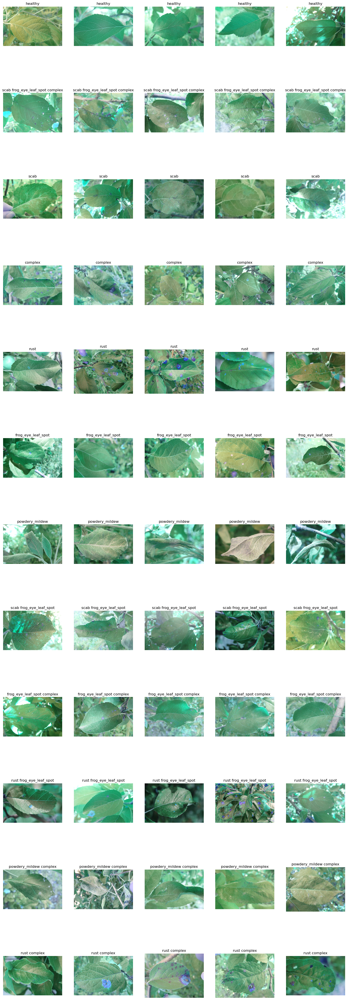

In [29]:
# Set up the subplot grid
fig, ax = plt.subplots(12, 5, figsize=(20,60))

# Flatten the subplot array to simplify iteration
ax = ax.flatten()

# Plot each image in its own subplot
for i, ax_i in enumerate(ax):
    image_path = f'../data_plant_disease/train_images/{sample.iloc[i, 1]}/{sample.iloc[i, 0]}'
    img = cv2.imread(image_path)
    ax_i.imshow(img)
    ax_i.set_title(sample.iloc[i, 1])
    ax_i.axis('off')

## Check class balance

In [30]:
count_class = train_labels.groupby('labels').count().reset_index()

px.bar(count_class, y='labels',x='image')

## Create one folder per class and move the images

In [ ]:
# import os
# import pandas as pd

# path = '../data_plant_disease/'

# # Ler o arquivo CSV
# df = pd.read_csv(path + "train.csv")

# # Obter o nome das classes únicas
# labels = df['labels'].unique()

# # Criar uma pasta para cada classe
# for label in labels:
#     os.makedirs(label, exist_ok=True)
#     os.rename(os.path.join(label), f'../data_plant_disease/train_images/{label}')

# # move to train_images
# path = path + 'train_images/'

# # Mover as imagens para as pastas correspondentes
# for index, row in df.iterrows():
#     os.rename(path + row['image'], path + f"{row['labels']}/{row['image']}")

## Create keras dataset

In [32]:
data = tf.keras.utils.image_dataset_from_directory('../data_plant_disease/train_images/')

data = data.map(lambda x, y: (x/255, y))

Found 18632 files belonging to 12 classes.
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [36]:
data_iterator = data.as_numpy_iterator()

In [41]:
batch = data_iterator.next()

In [42]:
# images represented as numpy arrays
batch[0].shape

(32, 256, 256, 3)

In [43]:
# label
batch[1]

array([ 6, 10,  6,  6,  9,  6,  9,  1,  3,  1,  0,  9,  3,  9,  3, 10,  0,
        3,  0,  0,  9,  9,  6,  5,  1,  6,  9,  6,  3,  3,  3,  9])

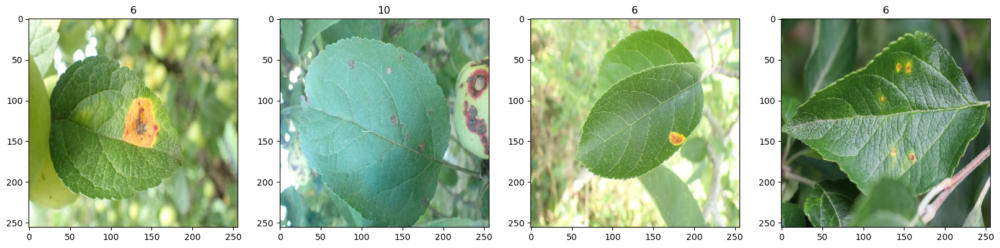

In [44]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

## Split Data

In [45]:
train_size = int(len(data)*.7) + 1
val_size = int(len(data)*.2)
test_size = int(len(data)*.1)


In [46]:
# verify if the size of all the data matches
train_size + test_size + val_size == len(data)

True

In [47]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

## Build Model

In [48]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

model = Sequential()

# add layers
model.add(Conv2D(16, (3,3), strides=1, activation = 'relu', input_shape = (256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), strides=1, activation = 'relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), strides=1, activation = 'relu'))
model.add(MaxPooling2D())

model.add(Flatten())

# Change the number of units to 12
model.add(Dense(256, activation = 'relu'))

# Add a final dense layer with 12 units and a softmax activation function for classification
model.add(Dense(12, activation='softmax'))

model.compile(optimizer = 'adam', loss='sparse_categorical_crossentropy', metrics = ['accuracy'])

model.summary()

logdir = 'logs'

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

hist = model.fit(train, epochs = 5, validation_data=val, callbacks=[tensorboard_callback])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)       0

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\HeitorFelixdeOliveir\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3457, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\HeitorFelixdeOliveir\AppData\Local\Temp\ipykernel_12876\163254425.py", line 32, in <module>
    hist = model.fit(train, epochs = 5, validation_data=val, callbacks=[tensorboard_callback])
  File "C:\Users\HeitorFelixdeOliveir\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "C:\Users\HeitorFelixdeOliveir\anaconda3\lib\site-packages\keras\engine\training.py", line 1650, in fit
    tmp_logs = self.train_function(iterator)
  File "C:\Users\HeitorFelixdeOliveir\anaconda3\lib\site-packages\tensorflow\python\util\traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "C:\Users\HeitorFelixdeOliveir\anaconda3\lib\site-packages\tensorflow\python\eager\polymorphic_f

TypeError: object of type 'NoneType' has no len()

In [113]:
model.save('model.h5')

In [ ]:
model.evaluate(x = test)